# Drive

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')
root_dir = "/content/gdrive/My Drive/"

Mounted at /content/gdrive/


# Libs

In [2]:
!pip install deep-translator

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.1 MB/s eta 0:00:00


In [3]:
!pip install salesforce-lavis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 26.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 92.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 27.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [4]:
import pandas as pd
import numpy as np
from PIL import Image
import requests
from tqdm import tqdm
import torch
import torch.nn.functional as F
from pkg_resources import packaging
from glob import glob
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
sns.set_theme("notebook", font_scale=1.3)
import os
import json
from deep_translator import GoogleTranslator
from scipy import spatial

from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
import numpy as np, matplotlib, matplotlib.pyplot as plt, seaborn as sns

# Unzip folder

In [5]:
!unzip /content/pietanze.zip

Archive:  /content/pietanze.zip
   creating: pietanze/
  inflating: pietanze/mappa.json     
  inflating: pietanze/.DS_Store      
   creating: pietanze/dolce/
  inflating: pietanze/dolce/bigne_1.jpg  
  inflating: pietanze/dolce/.DS_Store  
  inflating: pietanze/dolce/tiramisu_2.jpeg  
  inflating: pietanze/dolce/bigne_2.jpg  
  inflating: pietanze/dolce/bigne_3.jpg  
  inflating: pietanze/dolce/baba_1.jpeg  
  inflating: pietanze/dolce/crostata_1.jpg  
  inflating: pietanze/dolce/crostata_3.jpg  
  inflating: pietanze/dolce/crostata_2.jpg  
  inflating: pietanze/dolce/baba_2.jpg  
  inflating: pietanze/dolce/baba_3.jpg  
  inflating: pietanze/dolce/panna_cotta_1.jpeg  
  inflating: pietanze/dolce/panna_cotta_2.jpg  
  inflating: pietanze/dolce/panna_cotta_3.jpg  
  inflating: pietanze/dolce/tiramisu_1.jpg  
  inflating: pietanze/dolce/tiramisu_3.jpg  
  inflating: pietanze/dolce/millefoglie_1.jpg  
  inflating: pietanze/dolce/millefoglie_2.jpg  
  inflating: pietanze/dolce/millefogli

In [6]:
import json
image_map = None
with open('/content/pietanze/mappa.json', 'r') as f:
    image_map = json.load(f)

# Functions

In [7]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))

Using device: cuda

Tesla T4


In [8]:
def translate_caption(string):
    try:
        #print('ita_string: ', string)
        string_translated = GoogleTranslator(source='auto', target='en').translate(string)
        #print('string_translated: ', string_translated)
        return string_translated
    except Exception as e:
        string_translated = ''
        print("Errore per ita_string '{}' - caption '{}' - errore: {}".format(string))
        return string_translated

# Load images and texts

Read the map with the path to the images and their corresponding descriptions. Put the images and the descriptions in the lists "images" and "texts". Show images, description and name in a figure

In [9]:
principal_dir = "/content/pietanze"

images = []
texts = []
names_image = []
original_texts = []
#plt.figure(figsize=(300, 300)) # Width, height

# iter over the dishes
for _, dishes, _ in os.walk(principal_dir):
    for dish in dishes:
        path_dish = os.path.join(principal_dir, dish)
        CHECK_FOLDER = os.path.isdir(path_dish)
        if CHECK_FOLDER:
            print("DISH: ", dish)
            print("PATH DISH: ", path_dish)

            images_list = os.listdir(path_dish)
            print("images_list: ", images_list)
            for name_image in images_list:
                if name_image != ".DS_Store" and name_image != ".ipynb_checkpoints":
                    path_image = os.path.join(path_dish, name_image)
                    chiave = ("/").join(path_image.split("/")[2:])
                    image = Image.open(path_image).convert("RGB")
                    origninal_text = image_map[chiave]
                    text = translate_caption(origninal_text)

                    #plt.subplot(len(image_map), 1, len(images) + 1)
                    #plt.imshow(image)
                    #plt.title(f"{name_image}\n{text}")
                    #plt.xticks([])
                    #plt.yticks([])

                    images.append(image)
                    texts.append(text)
                    names_image.append(name_image)
                    original_texts.append(origninal_text)

            print("----------------------------------")

#plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/list_images_descriptions.png")
#plt.tight_layout()

DISH:  dolce
PATH DISH:  /content/pietanze/dolce
images_list:  ['panna_cotta_1.jpeg', 'baba_3.jpg', 'panna_cotta_2.jpg', 'crostata_2.jpg', 'tiramisu_2.jpeg', 'bigne_1.jpg', 'tiramisu_1.jpg', 'bigne_3.jpg', 'crostata_3.jpg', 'bigne_2.jpg', 'millefoglie_3.jpg', 'panna_cotta_3.jpg', 'millefoglie_2.jpg', 'crostata_1.jpg', 'baba_1.jpeg', '.DS_Store', 'tiramisu_3.jpg', 'millefoglie_1.jpg', 'baba_2.jpg']
----------------------------------
DISH:  pizza
PATH DISH:  /content/pietanze/pizza
images_list:  ['pizza_marinara_2.jpg', 'pizza_marinara_3.jpg', 'pizza_capricciosa_2.jpg', 'pizza_margherita_2.jpg', 'pizza_capricciosa_1.jpg', 'calzone_2.jpg', 'pizza_napoli_2.jpg', 'pizza_quattro_formaggi_2.jpg', 'pizza_margherita_3.jpg', 'pizza_quattro_formaggi_1.jpg', 'pizza_quattro_stagioni.jpg', 'pizza_marinara_1.jpg', 'pizza_margherita_1.jpg', '.DS_Store', 'pizza_napoli.jpg', 'pizza_quattro_stagioni_2.jpg', 'calzone.jpg', 'pizza_quattro_stagioni_3.jpg']
----------------------------------
DISH:  carne
PAT

# Apply BLIP2 from LAVIS lib - images, text and multimodal embedding

name="blip2_feature_extractor", model_type="pretrain_vitL"

According to the source code at https://github.com/salesforce/LAVIS/blob/main/lavis/models/blip2_models/blip2_qformer.py

this is the BLIP2 first-stage model with Q-former and vit-large

In [10]:
from lavis.models import load_model_and_preprocess
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip2_feature_extractor", model_type="pretrain_vitL", is_eval=True, device=device)

100%|██████████| 555M/555M [00:05<00:00, 100MB/s] 


100%|██████████| 699M/699M [00:08<00:00, 90.4MB/s]


## Extraction of the embeddings

In [11]:
images_embedding = None
texts_embedding = None
multimodal_embedding = None

# iter over the list of text and images

for text, image in zip(texts,images):
    image_processed = vis_processors["eval"](image).unsqueeze(0).to(device)
    text_translated = translate_caption(text)
    text_input = txt_processors["eval"](text_translated)
    sample = {"image": image_processed, "text_input": [text_input]}

    multimodal_emb = model.extract_features(sample).multimodal_embeds[:,0,:] # size (1, 768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[:,0,:] # size (1, 768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[:,0,:] # size (1, 768)

    # stack tensor
    if images_embedding is None:
        images_embedding = image_emb
    else:
       images_embedding = torch.cat((images_embedding, image_emb),0)

    if texts_embedding is None:
        texts_embedding = text_emb
    else:
       texts_embedding = torch.cat((texts_embedding, text_emb),0)

    if multimodal_embedding is None:
        multimodal_embedding = multimodal_emb
    else:
       multimodal_embedding = torch.cat((multimodal_embedding, multimodal_emb),0)

print('images_embedding.size(): ', images_embedding.size())
print('texts_embedding.size(): ', texts_embedding.size())
print('multimodal_embedding.size(): ', multimodal_embedding.size())
'''
images_embedding.size():  torch.Size([68, 768])
texts_embedding.size():  torch.Size([68, 768])
multimodal_embedding.size():  torch.Size([68, 768])
'''

images_embedding.size():  torch.Size([68, 768])
texts_embedding.size():  torch.Size([68, 768])
multimodal_embedding.size():  torch.Size([68, 768])


'\nimages_embedding.size():  torch.Size([69, 768])\ntexts_embedding.size():  torch.Size([69, 768])\nmultimodal_embedding.size():  torch.Size([69, 768])\n'

## Normalization

Divide each tensors by its norm. In this way when i calculate the dot product between two tensors i directly obtain the cosin between the two

In [12]:
images_embedding /= images_embedding.norm(dim=-1, keepdim=True)
texts_embedding /= texts_embedding.norm(dim=-1, keepdim=True)
multimodal_embedding /= multimodal_embedding.norm(dim=-1, keepdim=True)

## Similarity matrices

In [13]:
## image vs image
similarity_images = images_embedding.cpu().detach().numpy() @ images_embedding.cpu().detach().numpy().T
similarity_images_texts = images_embedding.cpu().detach().numpy() @ texts_embedding.cpu().detach().numpy().T
similarity_multimodal = multimodal_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T
similarity_images_multimodal = images_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T

function to plot the similarity matrixfor the plot i use
https://stackoverflow.com/questions/67310634/how-to-plot-image-image-similarity-matrix-map

In [14]:
def ImgLabels(N, ax):

    def offset_image(coord, image_plot, ax):

        im = matplotlib.offsetbox.OffsetImage(image_plot, zoom = 1)
        im.image.axes = ax

        for co, xyb in [((0, coord), (-30, -30)),    ((coord, N), (+30, -30))]: # these number have to be adjusted if change the image dimension as well as the number of examples
            ab = matplotlib.offsetbox.AnnotationBbox(im, co,  xybox = xyb,
                frameon=False, xycoords='data',  boxcoords="offset points", pad=0)
            ax.add_artist(ab)

    for i, img in enumerate(images):
        image_resized = img.resize((55, 55))
        offset_image(i, image_resized, ax)

def HeatMap(N, corr):
    sns.set_theme(style = "white")
    mask = np.triu(np.ones_like(corr, dtype = bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
                square=True, annot = True, xticklabels = False, yticklabels = False)


def plot_similarity_matrix(matrix, dimension, name_fig):
    f, ax = plt.subplots(figsize=(100, 100))
    HeatMap(dimension, matrix)
    ImgLabels(dimension, ax)
    plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/similarity_matrices/"+name_fig+".png")
    plt.show()

### Image-image similarity

In [52]:
name_fig = "images_blip2_pretrain_vitL"
plot_similarity_matrix(similarity_images, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Image-text similarity

In [53]:
name_fig = "images_texts_blip2_pretrain_vitL"
plot_similarity_matrix(similarity_images_texts, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Multimodal-multimodal similarity

In [54]:
name_fig = "multimodal_blip2_pretrain_vitL"
plot_similarity_matrix(similarity_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

### Images-multimodal similarity

In [55]:
name_fig = "images_multimodal_blip2_pretrain_vitL"
plot_similarity_matrix(similarity_images_multimodal, 68, name_fig)

Output hidden; open in https://colab.research.google.com to view.

## Search function

search_modality: (II for image vs image - TI for text vs image - MI for multimodal vs image -  IT for image vs text - TT for text vs text - MT for multimodal vs text - IM for image vs multimodal - TM for text vs multimodal - MM for multimodal vs multimodal). The first argument refers to the target product the second for the database product

In [19]:
def search_similar_product(image_target, text_target, number_retrieval, search_modality, len_dataset = 68, is_coco_finetuned = False):

    retrieval_map = {}

    # preprocess image. check if the image is None. In this case build a tensor with shape (1, 3, 224, 224)
    if image_target is None:
        if is_coco_finetuned:
            image_processed = torch.rand(1, 3, 364, 364).to(device)
        else:
            image_processed = torch.rand(1, 3, 224, 224).to(device)
    else:
      image_processed = vis_processors["eval"](image_target).unsqueeze(0).to(device)

    # preprocess text
    text_translated = translate_caption(text_target)
    text_input = txt_processors["eval"](text_translated)

    # build sample
    sample = {"image": image_processed, "text_input": [text_input]}

    # find features of image and text target
    multimodal_emb = model.extract_features(sample).multimodal_embeds[0,0,:] # size (768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[0,0,:] # size (768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[0,0,:] # size (768)

    # normalize
    image_emb /= image_emb.norm(dim=-1, keepdim=True)
    text_emb /= text_emb.norm(dim=-1, keepdim=True)
    multimodal_emb /= multimodal_emb.norm(dim=-1, keepdim=True)

    # transform to numpy tensor
    image_emb = image_emb.cpu().detach().numpy()
    text_emb = text_emb.cpu().detach().numpy()
    multimodal_emb = multimodal_emb.cpu().detach().numpy()

    if search_modality == "II":
      similarity_vector = images_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ multimodal_emb.T

    index_sorted = np.argsort(similarity_vector)

    for i in range(1, number_retrieval+1):

        print("Extracted: ", i)

        # index of the db product
        idx = index_sorted[len_dataset-i]
        similarity_value = similarity_vector[idx]

        print("idx: ", idx)
        print("similarity value: ", similarity_value)

        # extract name of the image
        name_image_found = names_image[idx]
        print("name_image_found: ", name_image_found)
        print("-----------------------")

        # extract text of the image
        text_image_found = original_texts[idx]
        translated_text_image_found = texts[idx]

        # extract image
        image_found = images[idx]

        #fill the extracted infos in the map
        retrieval_map[i] = (image_found, name_image_found, text_image_found, translated_text_image_found, similarity_value)

    return retrieval_map

### Test 1

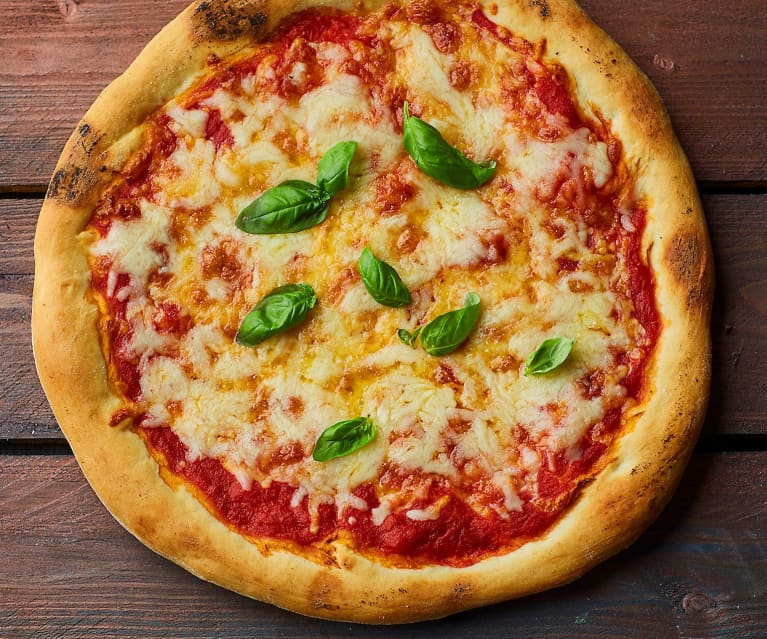

In [20]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pizza_marghetita_test.jpg"
text_image_target = ""
number_retrieval = 3
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  21
similarity value:  0.89416456
name_image_found:  pizza_margherita_2.jpg
-----------------------
Extracted:  2
idx:  30
similarity value:  0.8635445
name_image_found:  pizza_margherita_1.jpg
-----------------------
Extracted:  3
idx:  18
similarity value:  0.834614
name_image_found:  pizza_marinara_2.jpg
-----------------------


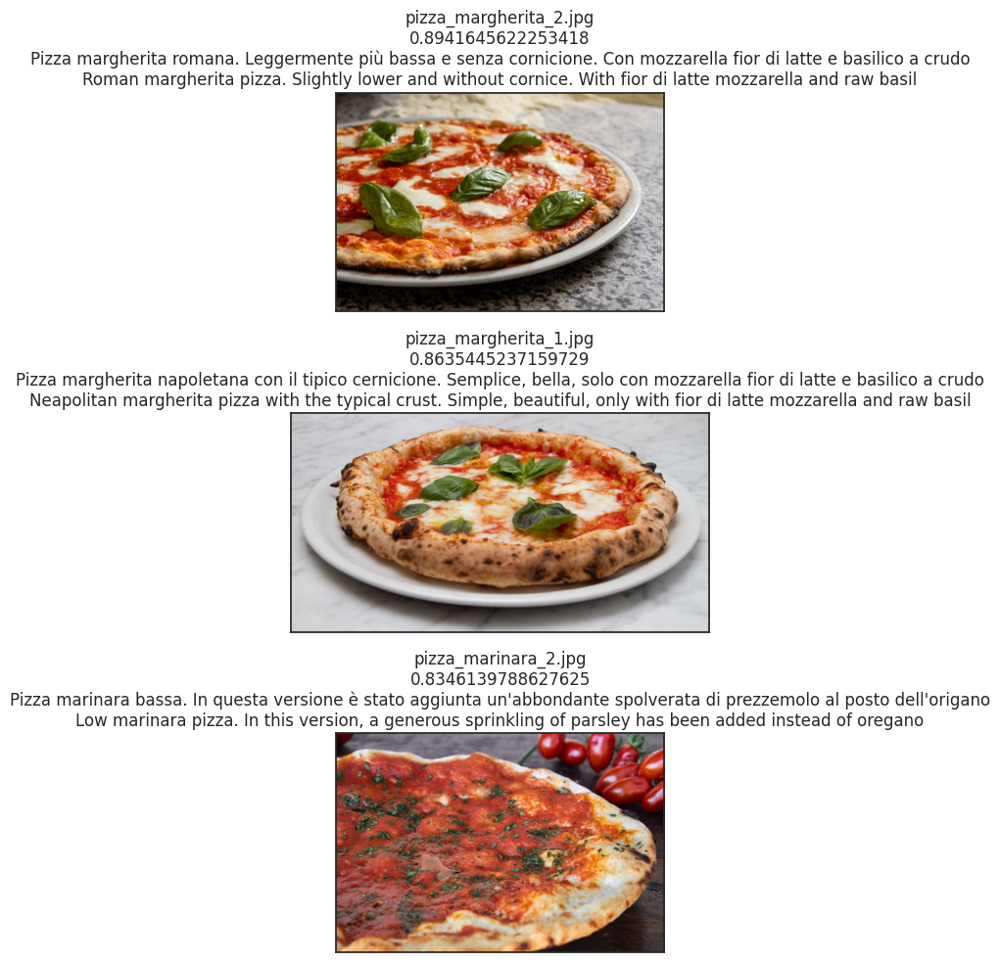

In [21]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 2

In [22]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/bistecca_fiorentina_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  48
similarity value:  0.8792679
name_image_found:  bistecca_fiorentina_3.jpg
-----------------------
Extracted:  2
idx:  47
similarity value:  0.76184094
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  3
idx:  43
similarity value:  0.717746
name_image_found:  bistecca_fiorentina_2.jpg
-----------------------
Extracted:  4
idx:  53
similarity value:  0.6904359
name_image_found:  bistecca_fiorentina_1.jpg
-----------------------
Extracted:  5
idx:  37
similarity value:  0.6722922
name_image_found:  filetto_manzo_2.jpeg
-----------------------


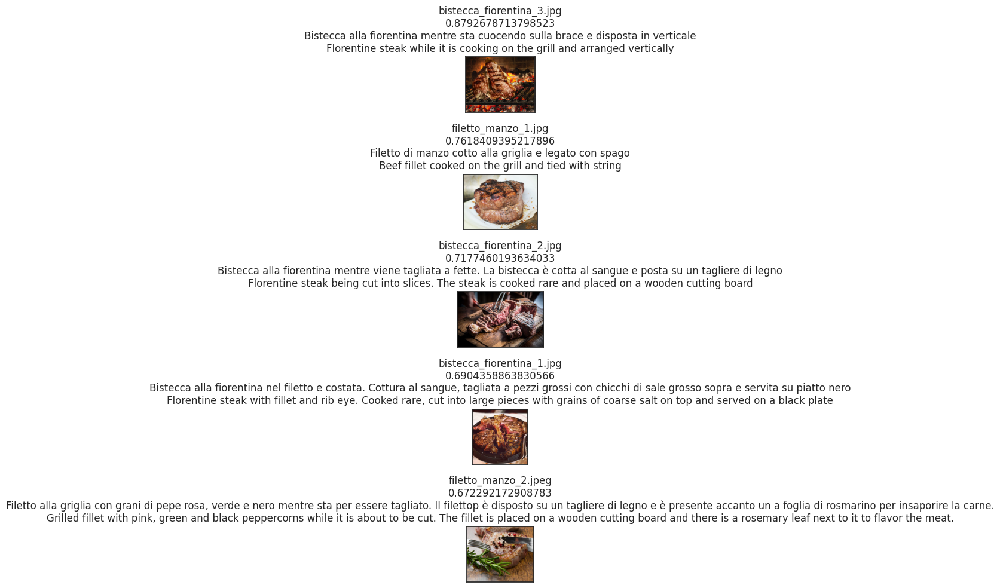

In [23]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 3


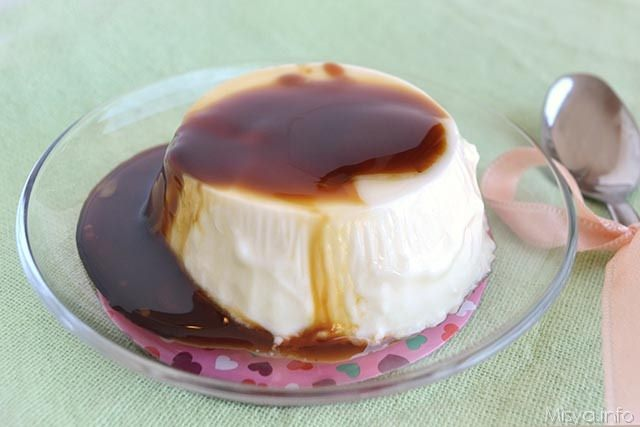

In [24]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panna_cotta_caramello_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  2
similarity value:  0.89949393
name_image_found:  panna_cotta_2.jpg
-----------------------
Extracted:  2
idx:  11
similarity value:  0.707908
name_image_found:  panna_cotta_3.jpg
-----------------------
Extracted:  3
idx:  1
similarity value:  0.65499693
name_image_found:  baba_3.jpg
-----------------------
Extracted:  4
idx:  0
similarity value:  0.6325441
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  5
idx:  46
similarity value:  0.5989281
name_image_found:  vitello_tonnato_2.jpg
-----------------------


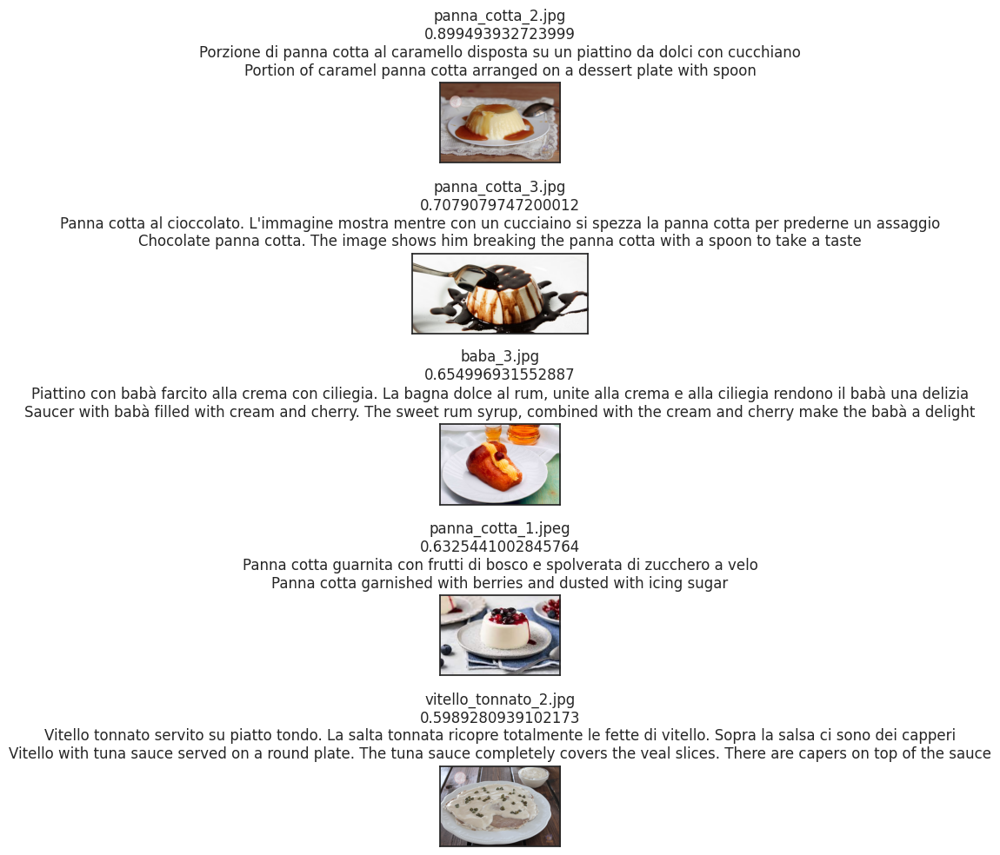

In [25]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 4

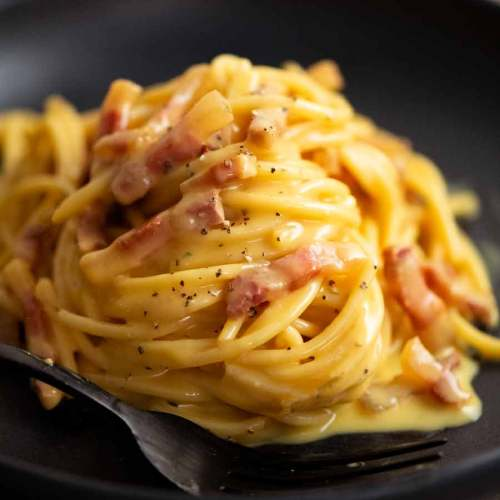

In [26]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_carbonara_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  67
similarity value:  0.807672
name_image_found:  carbonara_3.jpeg
-----------------------
Extracted:  2
idx:  60
similarity value:  0.8066993
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  3
idx:  59
similarity value:  0.79159725
name_image_found:  carbonara_1.jpg
-----------------------
Extracted:  4
idx:  65
similarity value:  0.6767536
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  5
idx:  54
similarity value:  0.66465497
name_image_found:  pasta_amatriciana_1.jpg
-----------------------


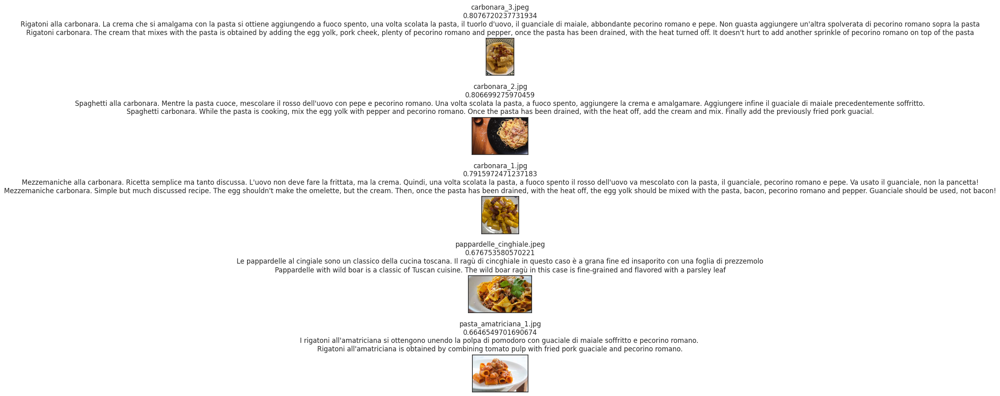

In [27]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 5

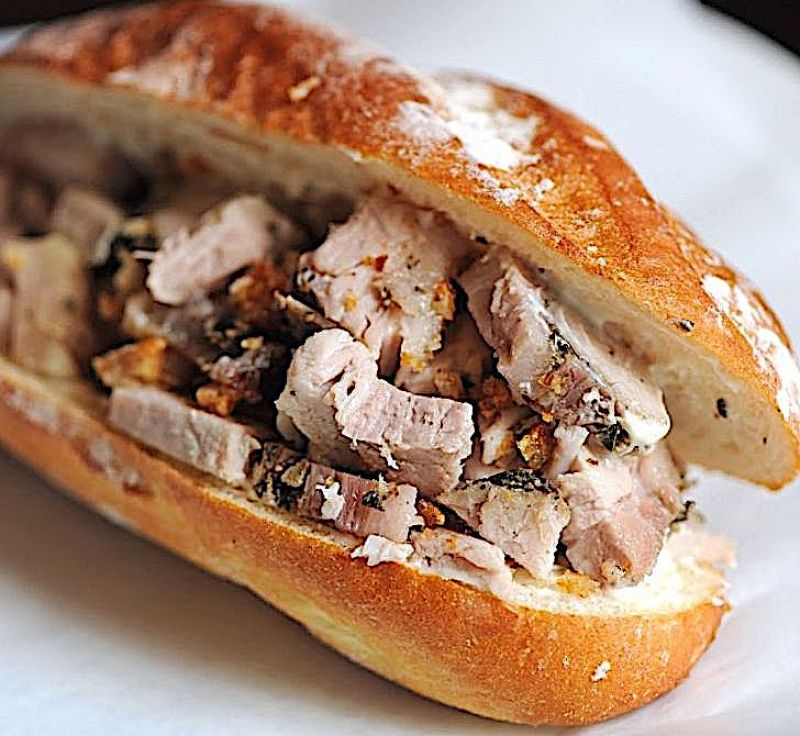

In [28]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panino_porchetta_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  51
similarity value:  0.7146052
name_image_found:  porchetta_1.jpg
-----------------------
Extracted:  2
idx:  41
similarity value:  0.6653176
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  3
idx:  50
similarity value:  0.6470303
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  4
idx:  38
similarity value:  0.5574463
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  5
idx:  40
similarity value:  0.5509557
name_image_found:  vitello_tonnato_3.jpg
-----------------------


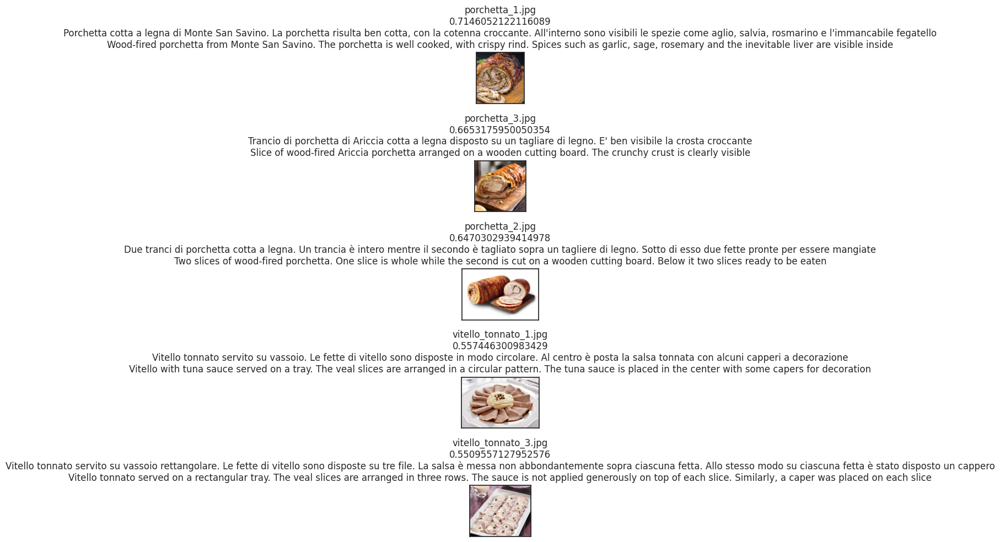

In [29]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 6

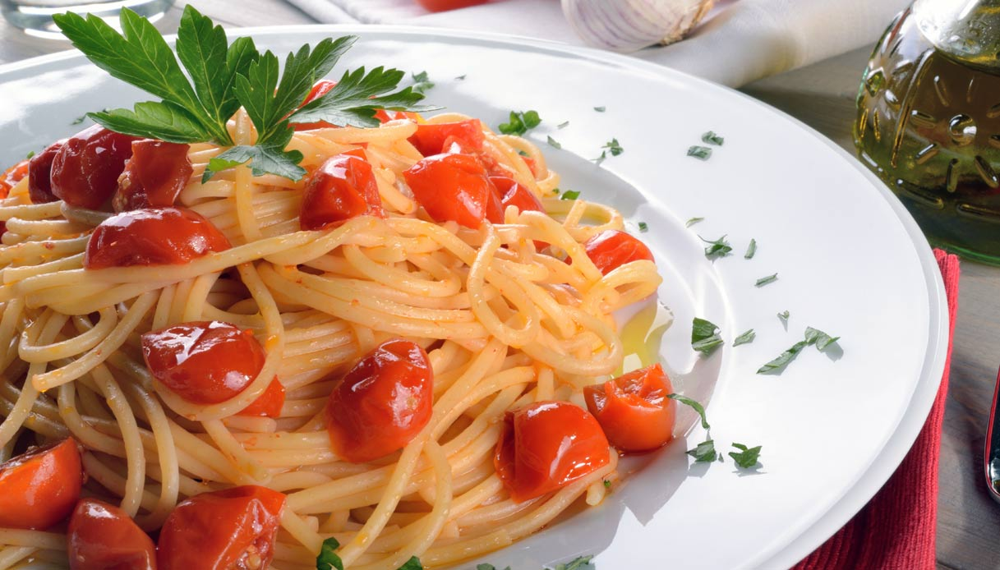

In [30]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_pomodorini_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  57
similarity value:  0.83003855
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  2
idx:  66
similarity value:  0.815004
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  3
idx:  62
similarity value:  0.75278366
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  4
idx:  54
similarity value:  0.7146013
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  5
idx:  64
similarity value:  0.6873599
name_image_found:  pasta_amatriciana_2.jpg
-----------------------


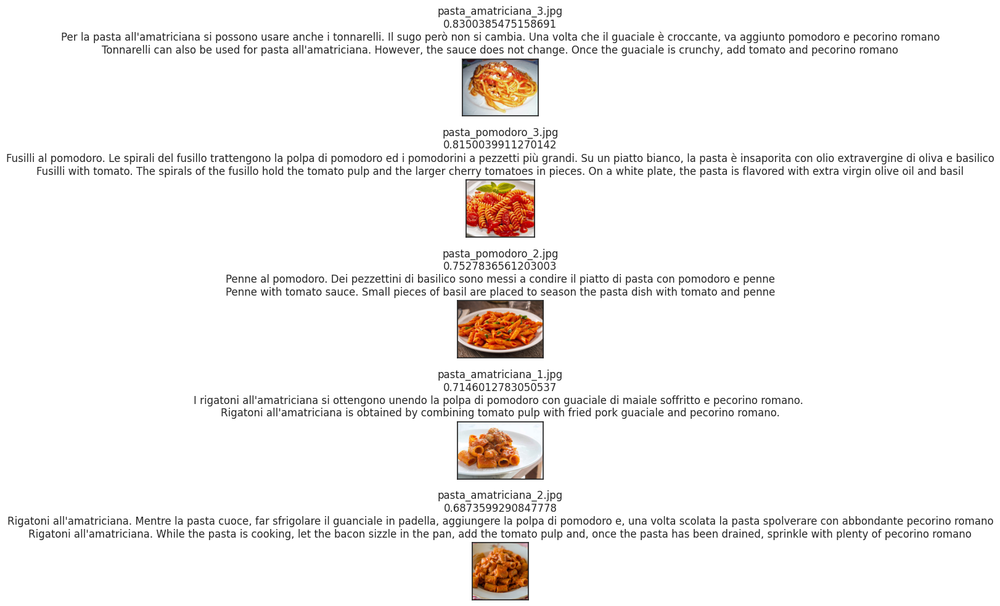

In [31]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 7

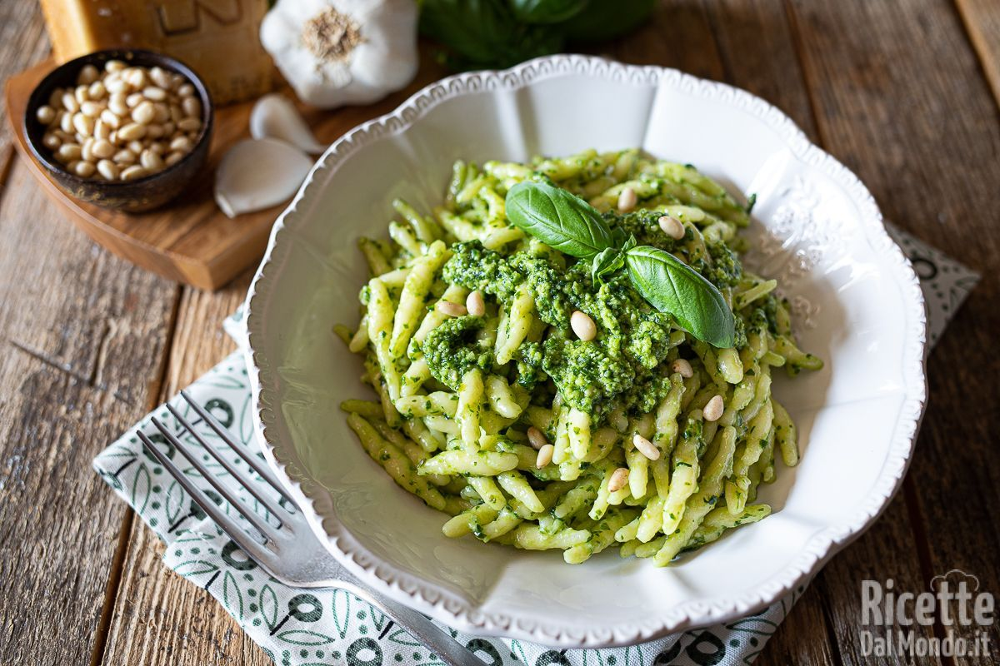

In [32]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/trofie_pesto_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  56
similarity value:  0.7718977
name_image_found:  pasta_pesto_1.jpg
-----------------------
Extracted:  2
idx:  58
similarity value:  0.6751755
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  3
idx:  62
similarity value:  0.62517226
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  4
idx:  55
similarity value:  0.6002861
name_image_found:  pasta_norma_2.jpg
-----------------------
Extracted:  5
idx:  61
similarity value:  0.5705197
name_image_found:  pasta_norma_1.jpeg
-----------------------


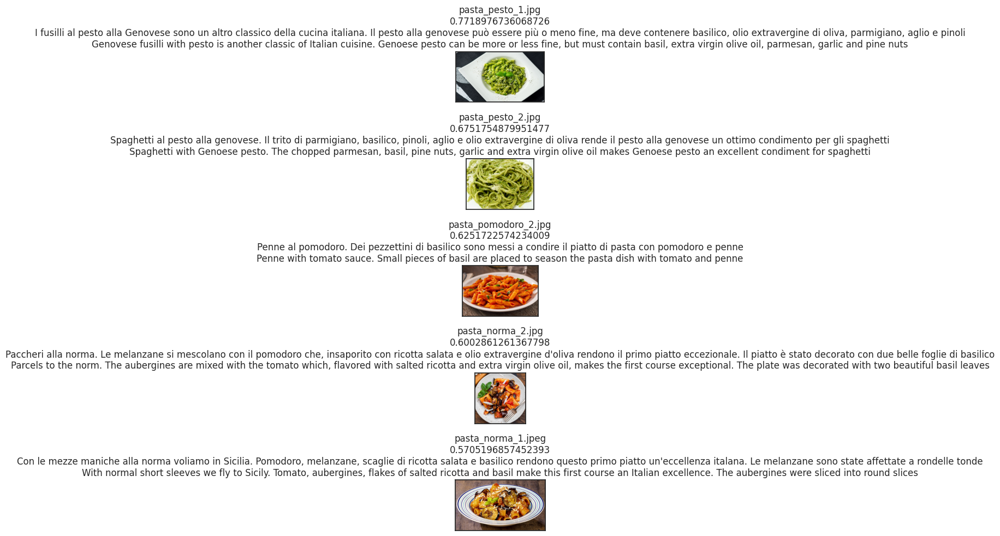

In [33]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 8

In [34]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/vitello_tonnato_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Output hidden; open in https://colab.research.google.com to view.

Extracted:  1
idx:  38
similarity value:  0.82796806
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  2
idx:  46
similarity value:  0.7695167
name_image_found:  vitello_tonnato_2.jpg
-----------------------
Extracted:  3
idx:  40
similarity value:  0.6991612
name_image_found:  vitello_tonnato_3.jpg
-----------------------
Extracted:  4
idx:  49
similarity value:  0.62926835
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  5
idx:  63
similarity value:  0.5549035
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------


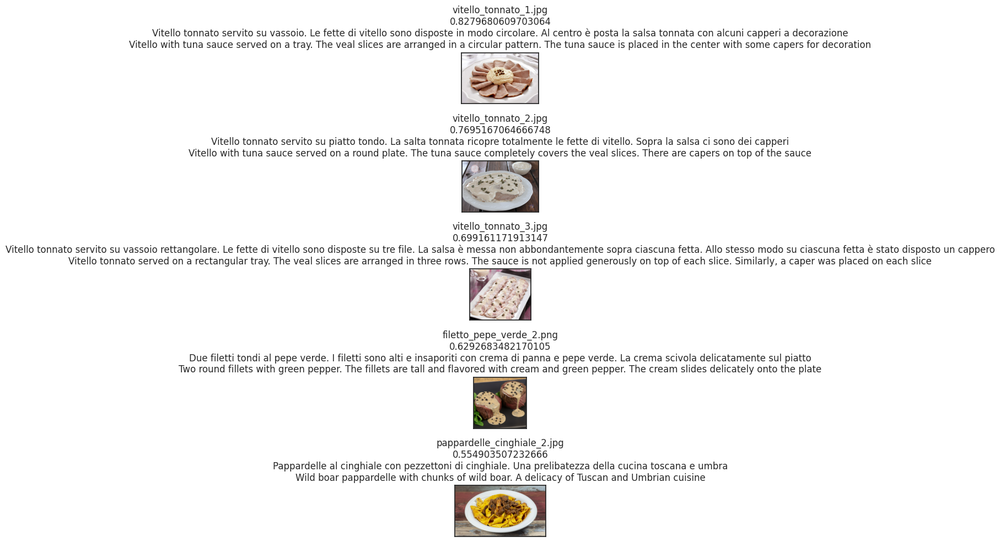

In [35]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 9

In [36]:
text_image_target = "Pizza quattro stagioni con olive, funghi e prosciutto cotto"
number_retrieval = 5

Extracted:  1
idx:  28
similarity value:  0.27940336
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  2
idx:  34
similarity value:  0.25884867
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  3
idx:  20
similarity value:  0.25704885
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  4
idx:  32
similarity value:  0.24892592
name_image_found:  pizza_quattro_stagioni_2.jpg
-----------------------
Extracted:  5
idx:  22
similarity value:  0.24839686
name_image_found:  pizza_capricciosa_1.jpg
-----------------------


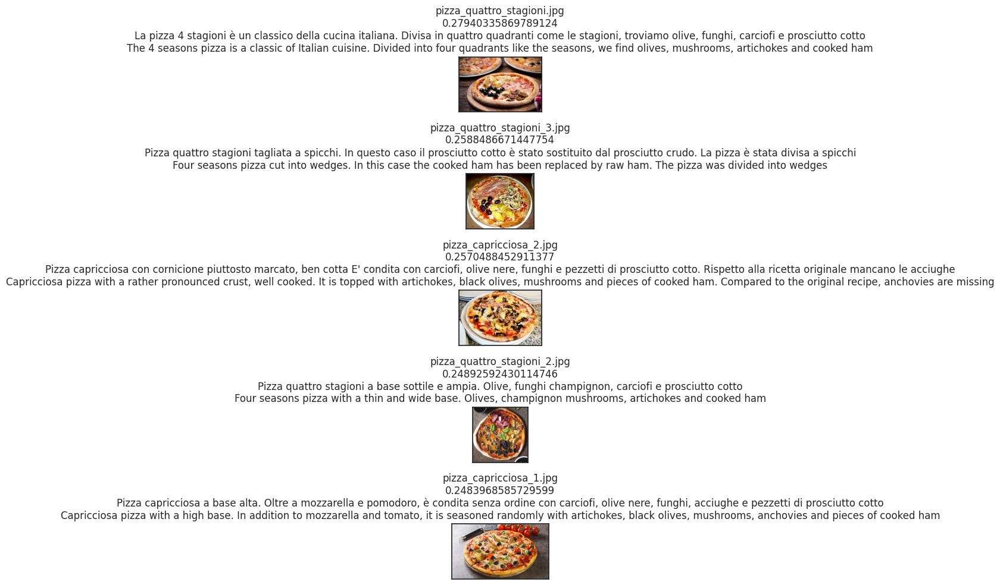

In [37]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  14
similarity value:  0.72167134
name_image_found:  baba_1.jpeg
-----------------------
Extracted:  2
idx:  1
similarity value:  0.68218195
name_image_found:  baba_3.jpg
-----------------------
Extracted:  3
idx:  17
similarity value:  0.6635624
name_image_found:  baba_2.jpg
-----------------------
Extracted:  4
idx:  26
similarity value:  0.6393928
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  5
idx:  56
similarity value:  0.6154438
name_image_found:  pasta_pesto_1.jpg
-----------------------


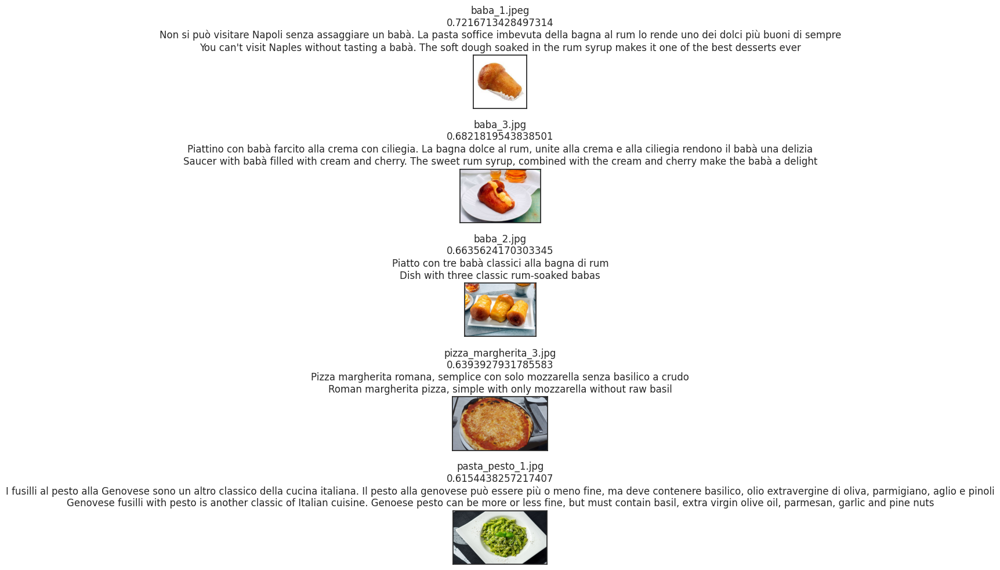

In [38]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  29
similarity value:  0.8407885
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  2
idx:  26
similarity value:  0.84053
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  3
idx:  21
similarity value:  0.8403873
name_image_found:  pizza_margherita_2.jpg
-----------------------
Extracted:  4
idx:  41
similarity value:  0.7967604
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  5
idx:  50
similarity value:  0.7947589
name_image_found:  porchetta_2.jpg
-----------------------


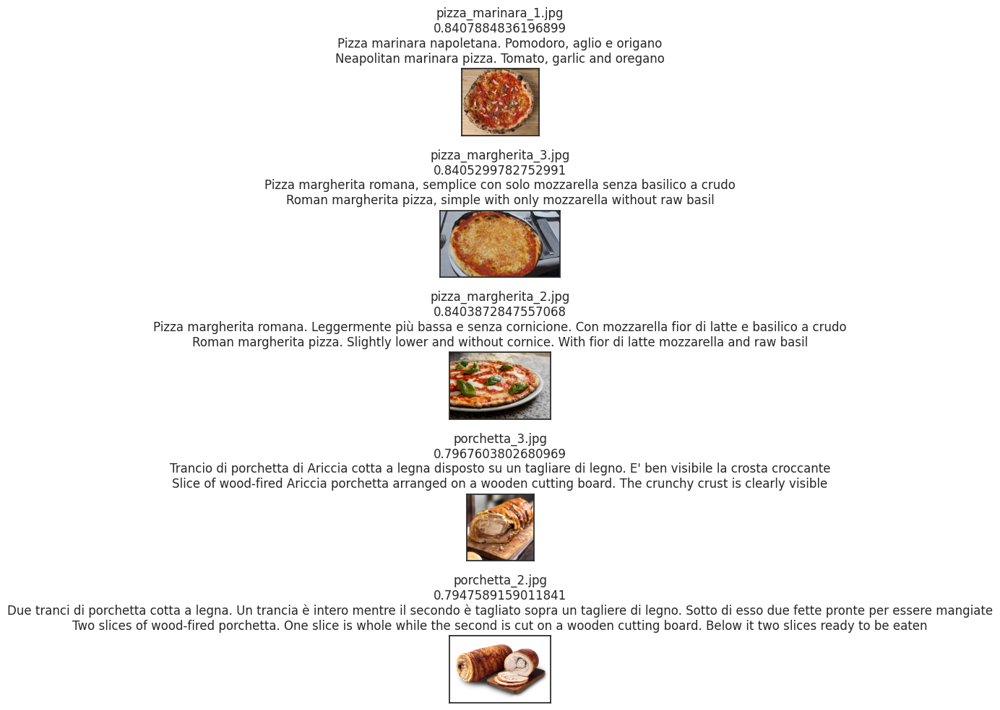

In [39]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")

plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 10

In [40]:
text_image_target = "PAppardelle al sugo di cinghiale senza pomodoro"
number_retrieval = 5

Extracted:  1
idx:  54
similarity value:  0.29162353
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  2
idx:  65
similarity value:  0.2851963
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  3
idx:  64
similarity value:  0.27374423
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  4
idx:  57
similarity value:  0.27272642
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  5
idx:  55
similarity value:  0.27249962
name_image_found:  pasta_norma_2.jpg
-----------------------


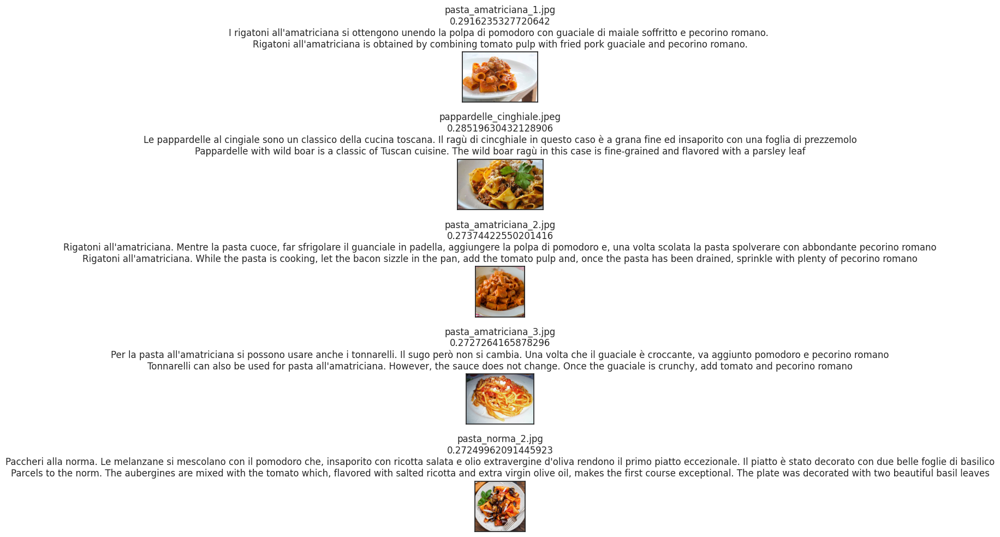

In [41]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  63
similarity value:  0.6737881
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------
Extracted:  2
idx:  65
similarity value:  0.66230416
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  3
idx:  40
similarity value:  0.652039
name_image_found:  vitello_tonnato_3.jpg
-----------------------
Extracted:  4
idx:  49
similarity value:  0.6383349
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  5
idx:  1
similarity value:  0.6377836
name_image_found:  baba_3.jpg
-----------------------


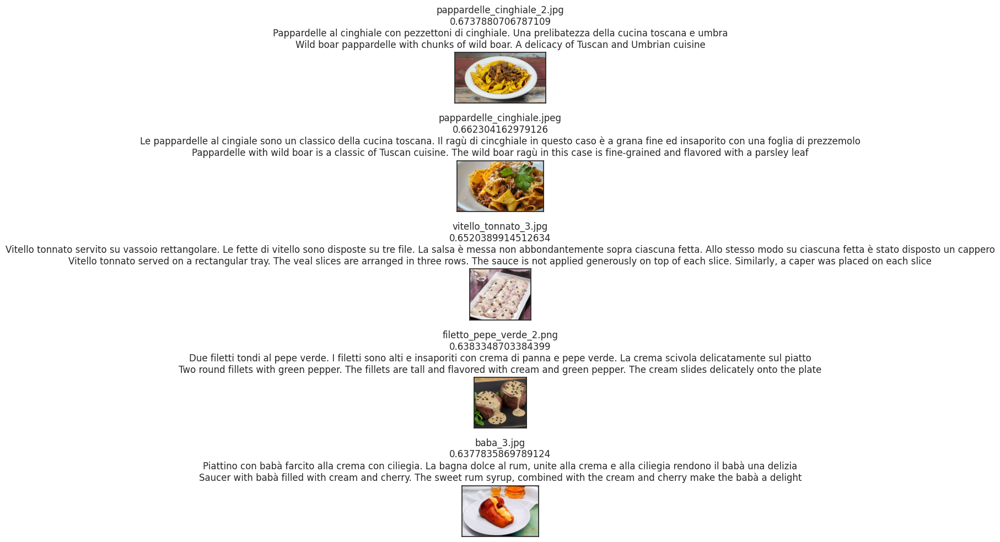

In [42]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  65
similarity value:  0.9369295
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  2
idx:  57
similarity value:  0.8523052
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  3
idx:  21
similarity value:  0.84779847
name_image_found:  pizza_margherita_2.jpg
-----------------------
Extracted:  4
idx:  54
similarity value:  0.84637916
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  5
idx:  26
similarity value:  0.8458545
name_image_found:  pizza_margherita_3.jpg
-----------------------


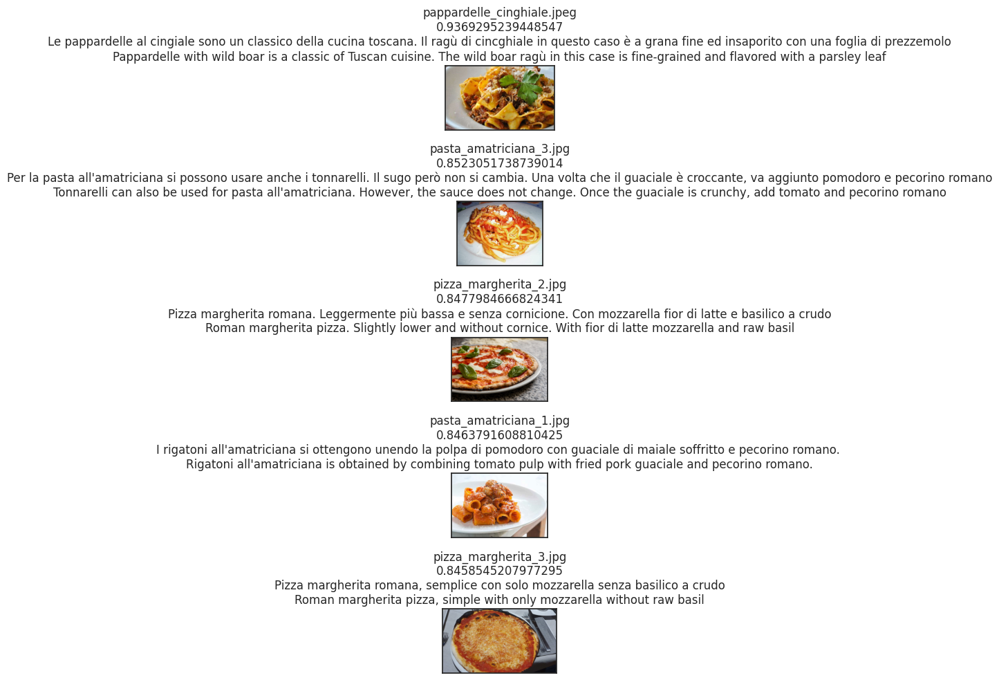

In [43]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 11

In [44]:
text_image_target = "Crostata con fragole, crema e gocce di cioccolato e zucchero a velo"
number_retrieval = 5

Extracted:  1
idx:  13
similarity value:  0.30659932
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  2
idx:  10
similarity value:  0.27259126
name_image_found:  millefoglie_3.jpg
-----------------------
Extracted:  3
idx:  8
similarity value:  0.2567801
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  4
idx:  12
similarity value:  0.24229977
name_image_found:  millefoglie_2.jpg
-----------------------
Extracted:  5
idx:  3
similarity value:  0.21900883
name_image_found:  crostata_2.jpg
-----------------------


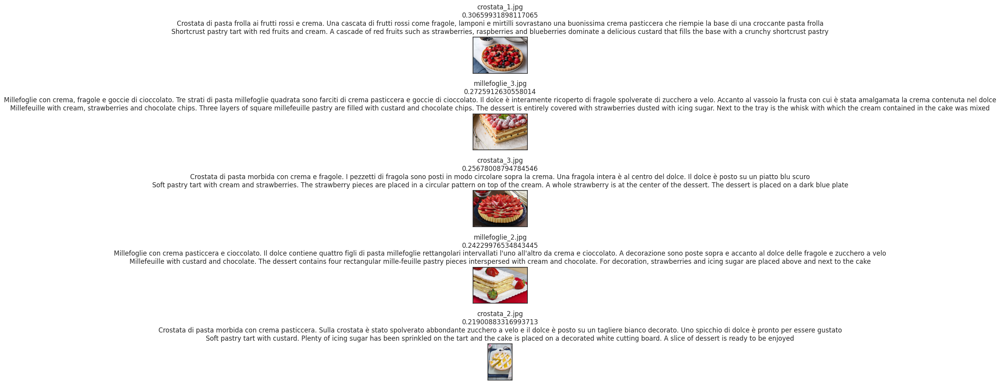

In [45]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  1
similarity value:  0.5763345
name_image_found:  baba_3.jpg
-----------------------
Extracted:  2
idx:  17
similarity value:  0.50042474
name_image_found:  baba_2.jpg
-----------------------
Extracted:  3
idx:  14
similarity value:  0.4816935
name_image_found:  baba_1.jpeg
-----------------------
Extracted:  4
idx:  26
similarity value:  0.4657264
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  5
idx:  49
similarity value:  0.445809
name_image_found:  filetto_pepe_verde_2.png
-----------------------


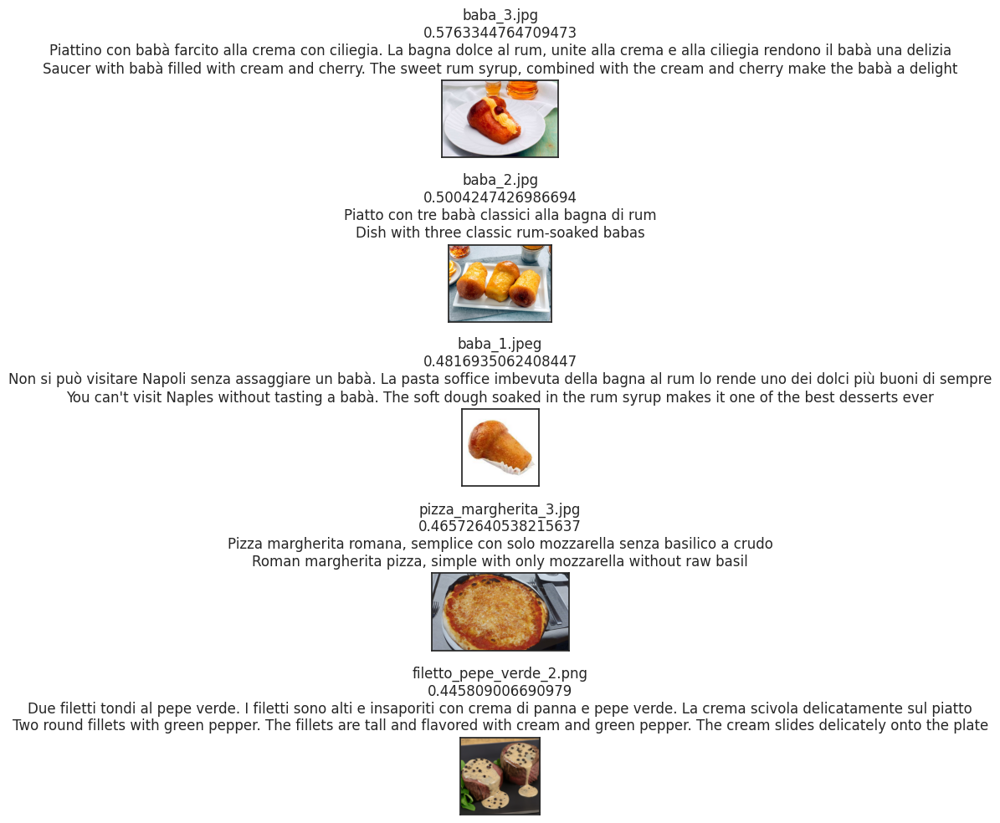

In [46]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  8
similarity value:  0.84700644
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  2
idx:  13
similarity value:  0.8450349
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  3
idx:  0
similarity value:  0.8142408
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  4
idx:  25
similarity value:  0.7809677
name_image_found:  pizza_quattro_formaggi_2.jpg
-----------------------
Extracted:  5
idx:  3
similarity value:  0.77026767
name_image_found:  crostata_2.jpg
-----------------------


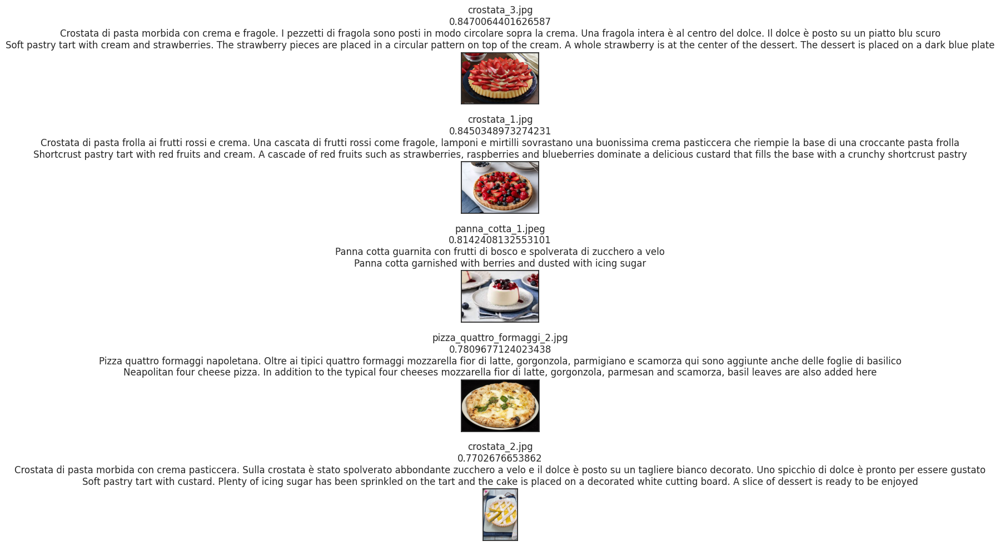

In [47]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 12

In [48]:
text_image_target = "Pasta all'amatriciana con pomodori, guanciale, spaghetti e spolverata di pecorino romano"
number_retrieval = 5

Extracted:  1
idx:  57
similarity value:  0.2725285
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  2
idx:  54
similarity value:  0.2646489
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  3
idx:  65
similarity value:  0.25708705
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  4
idx:  66
similarity value:  0.25652176
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  5
idx:  62
similarity value:  0.25508764
name_image_found:  pasta_pomodoro_2.jpg
-----------------------


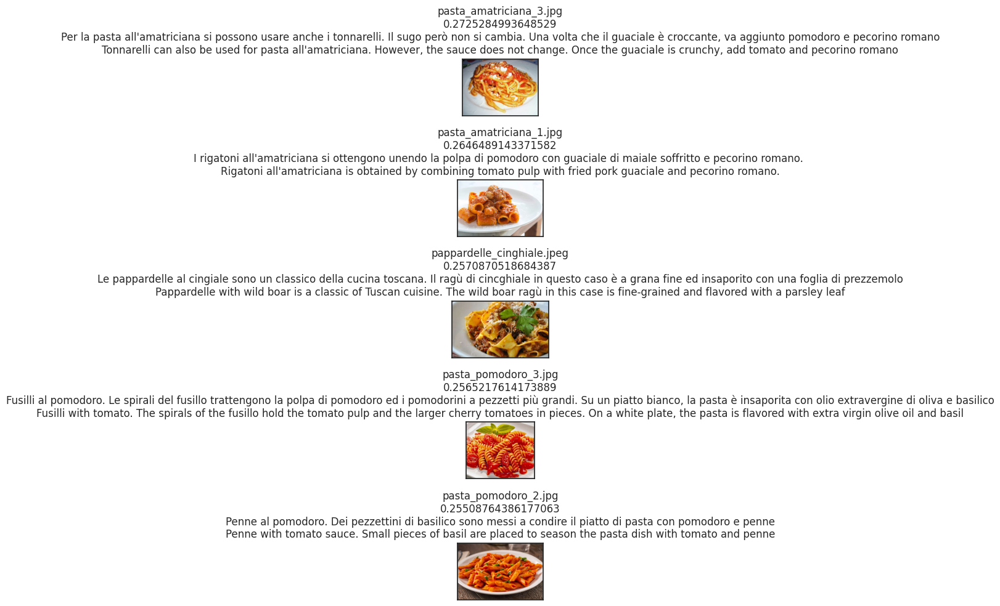

In [49]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  1
similarity value:  0.5326448
name_image_found:  baba_3.jpg
-----------------------
Extracted:  2
idx:  14
similarity value:  0.46654457
name_image_found:  baba_1.jpeg
-----------------------
Extracted:  3
idx:  17
similarity value:  0.42800295
name_image_found:  baba_2.jpg
-----------------------
Extracted:  4
idx:  26
similarity value:  0.41774172
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  5
idx:  47
similarity value:  0.40214294
name_image_found:  filetto_manzo_1.jpg
-----------------------


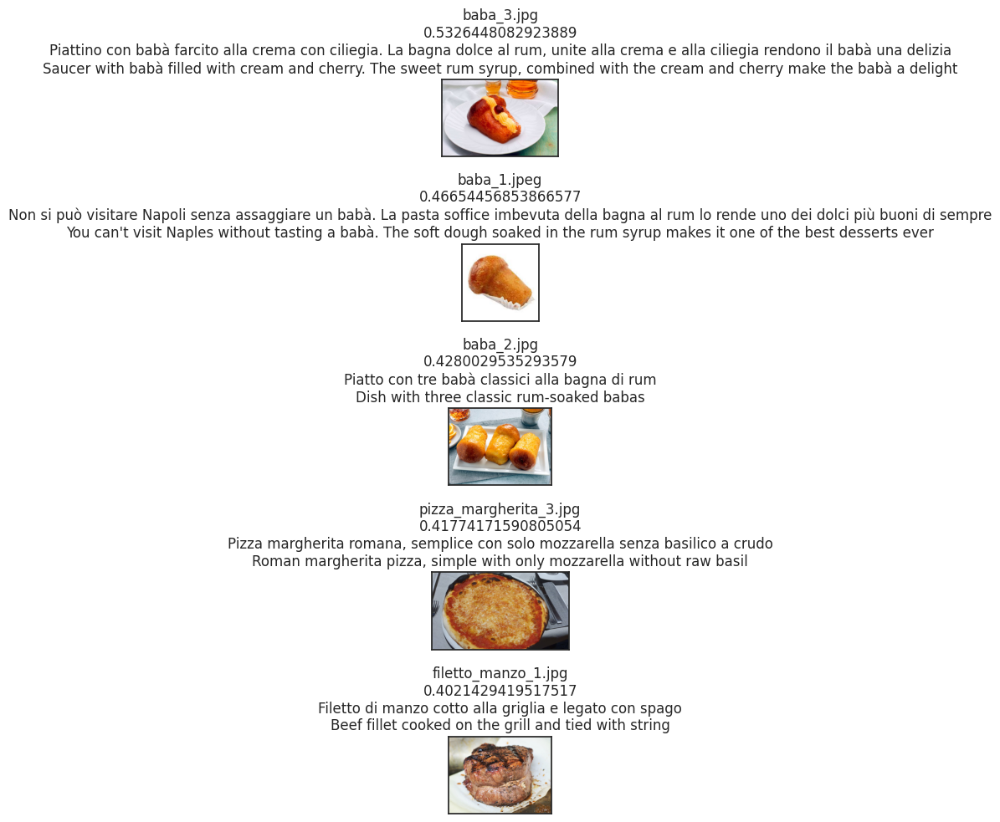

In [50]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  64
similarity value:  0.9317633
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  2
idx:  57
similarity value:  0.91738594
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  3
idx:  54
similarity value:  0.88801455
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  29
similarity value:  0.879625
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  5
idx:  26
similarity value:  0.8706878
name_image_found:  pizza_margherita_3.jpg
-----------------------


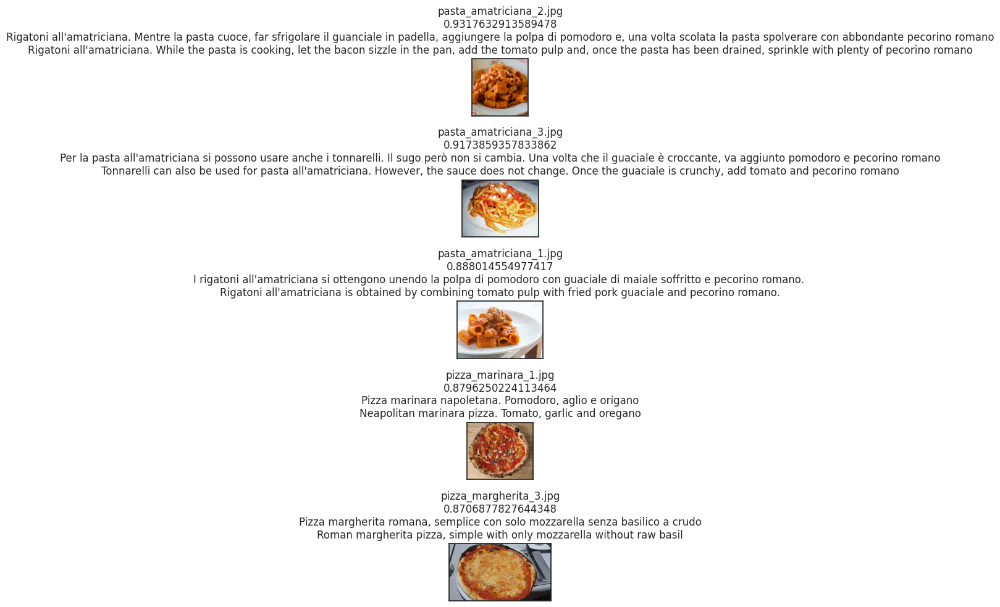

In [51]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()